# Projet Long - Analyse non supervisé

In [ ]:
!pip install pyclustering

In [ ]:
!pip install scikit-learn-extra

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 8.2 MB/s eta 0:00:00


In [ ]:
!pip install hdbscan

In [ ]:
!pip install umap-learn

# NINETH VERSION - CLARANS

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from pyclustering.cluster.clarans import clarans
from pyclustering.cluster import cluster_visualizer

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

# Convertir les données en une liste de listes pour l'entrée dans pyclustering
data_list = encoded_data.values.tolist()

# CLARANS

clarans_instance = clarans(data_list, 4, 5, 15)  # Utilisez les valeurs appropriées pour les paramètres (nombre de clusters et nombre de voisins)
clarans_instance.process()

# Obtenez les résultats du clustering
cluster_centers = clarans_instance.get_clusters()
cluster_labels = [0] * len(data_list)
for cluster_index, cluster in enumerate(cluster_centers):
    for point_index in cluster:
        cluster_labels[point_index] = cluster_index

# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()

# EIGHTH VERSION - HDBSCAN for loop

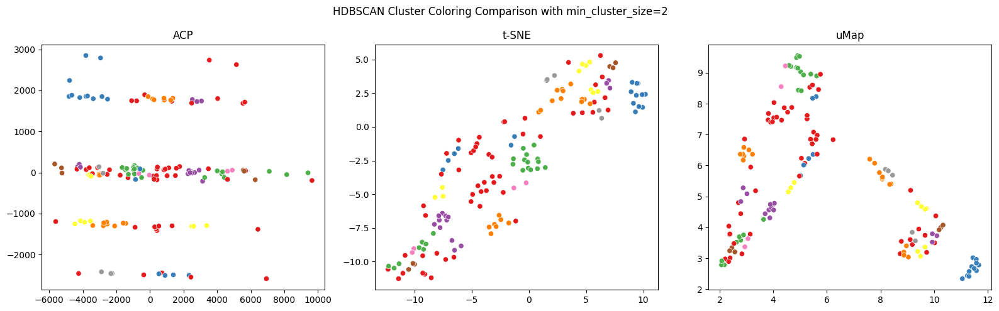

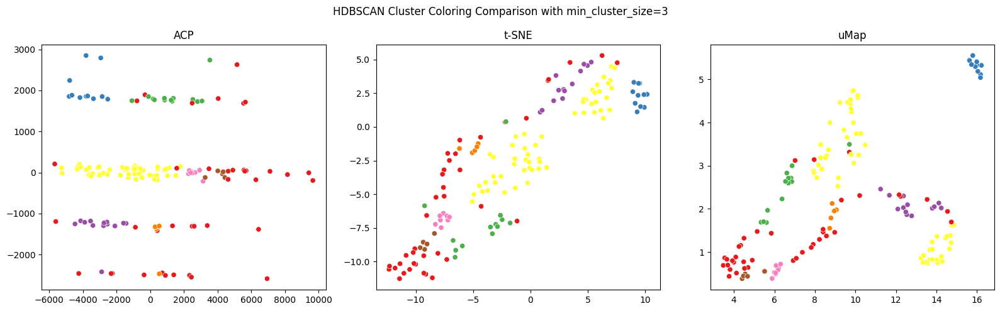

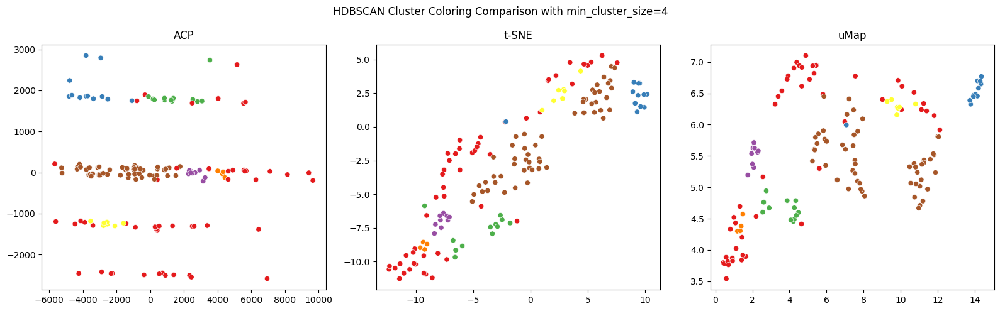

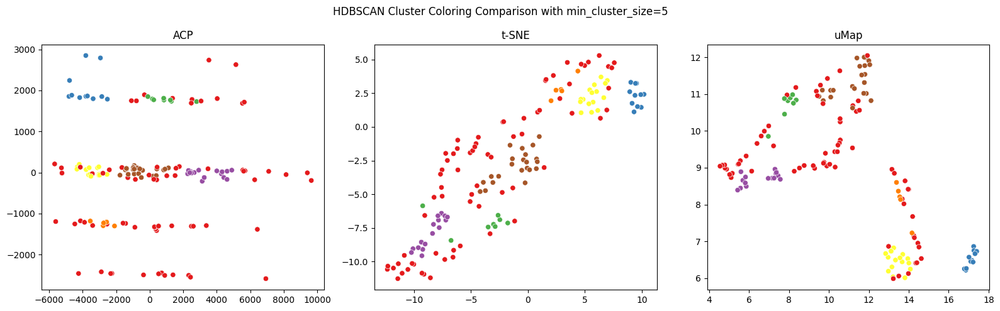

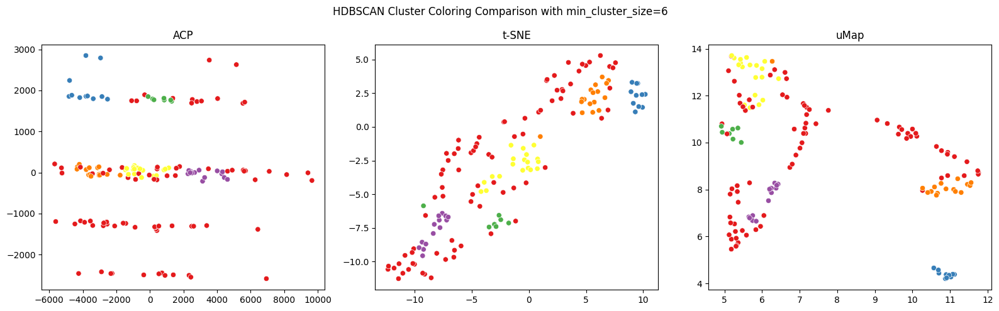

...

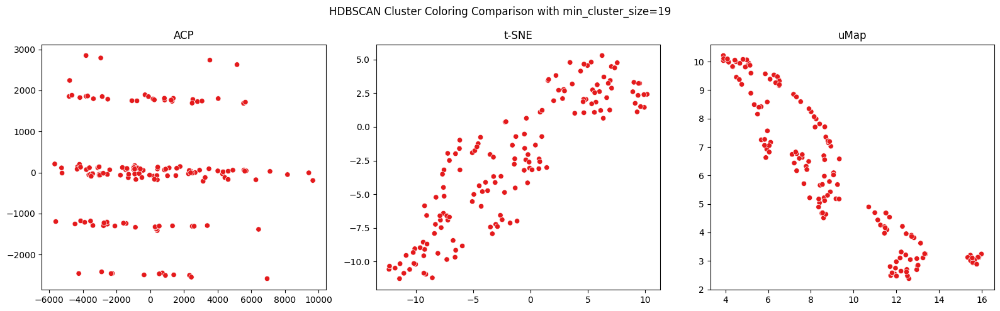

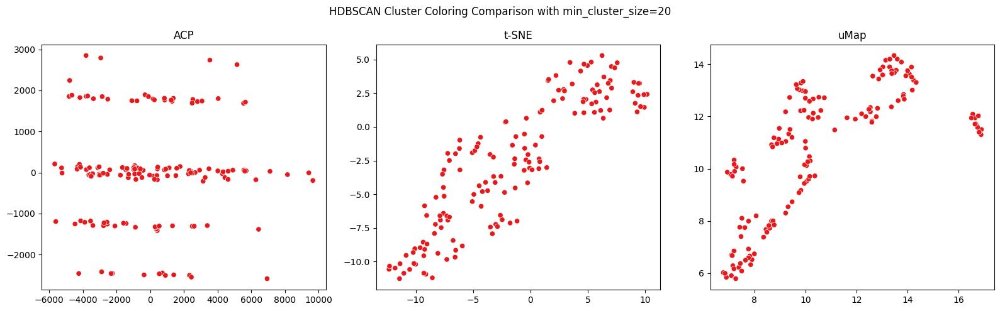

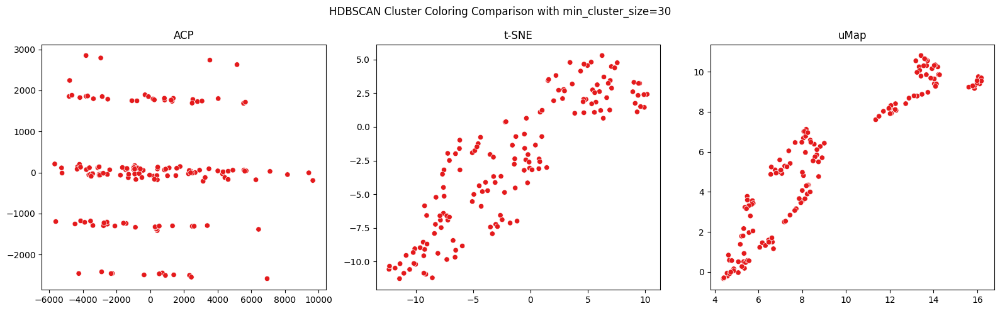

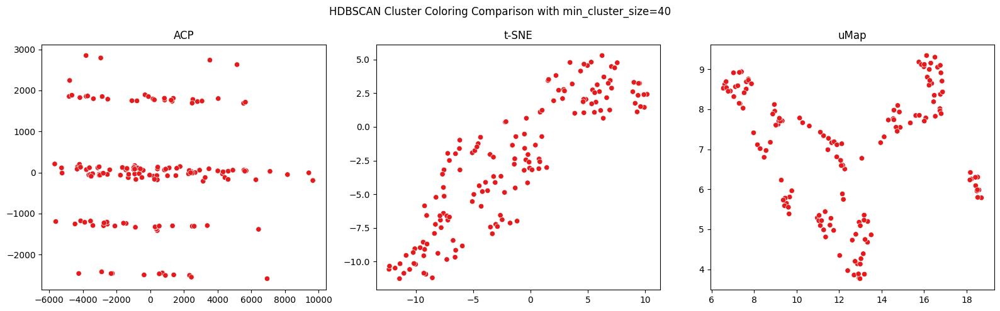

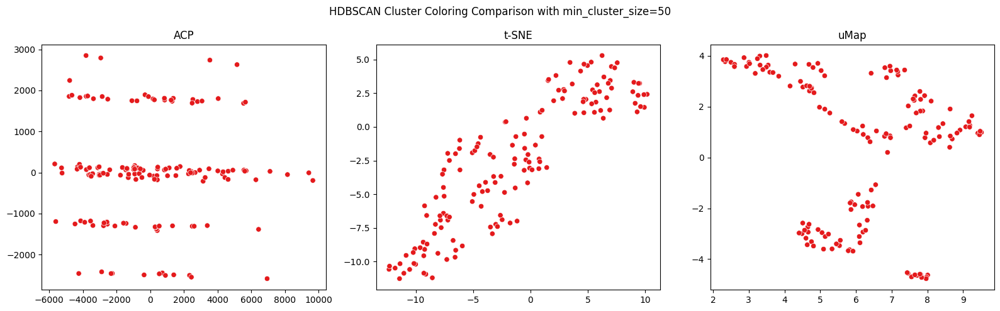

KeyboardInterrupt: 

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
import hdbscan

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

min_cluster_size_list = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]

for min_cluster_size in min_cluster_size_list:

  # Clustering avec HDBSCAN
  clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size)  # Vous pouvez ajuster les paramètres selon vos besoins
  cluster_labels = clusterer.fit_predict(encoded_data)

  # ACP
  pca = PCA(n_components=2)
  pca_result = pca.fit_transform(encoded_data)

  # t-SNE
  tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
  tsne_result = tsne.fit_transform(encoded_data)

  # uMap
  umap = UMAP(n_components=2)
  umap_result = umap.fit_transform(encoded_data)

  # Plotting with cluster coloring
  plt.figure(figsize=(16, 5))
  plt.suptitle('HDBSCAN Cluster Coloring Comparison with min_cluster_size=' + str(min_cluster_size))

  plt.subplot(1, 3, 1)
  sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
  plt.title('ACP')

  plt.subplot(1, 3, 2)
  sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
  plt.title('t-SNE')

  plt.subplot(1, 3, 3)
  sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
  plt.title('uMap')

  plt.tight_layout()
  plt.show()

# EIGHTH VERSION (2) - HDBSCAN for loop

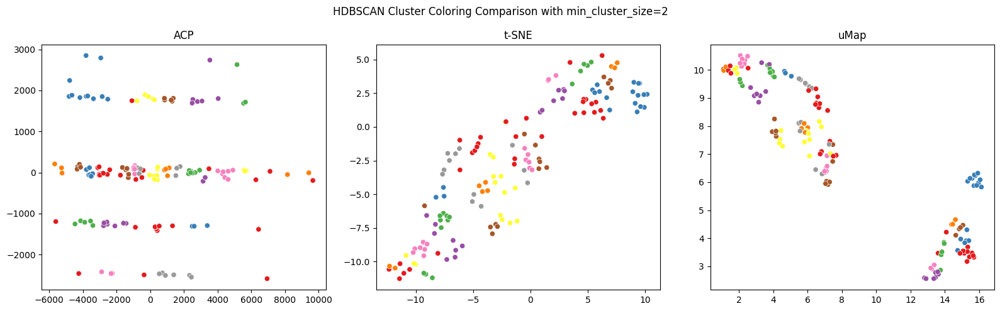

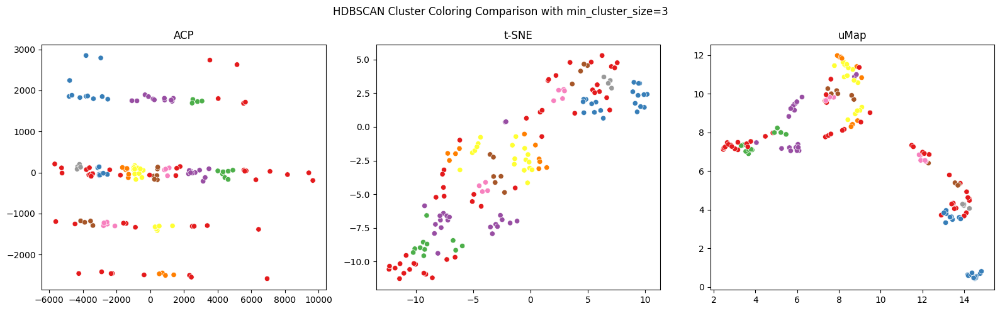

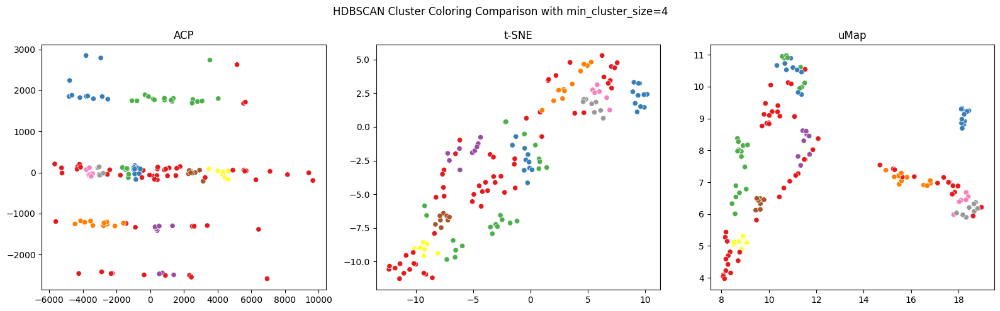

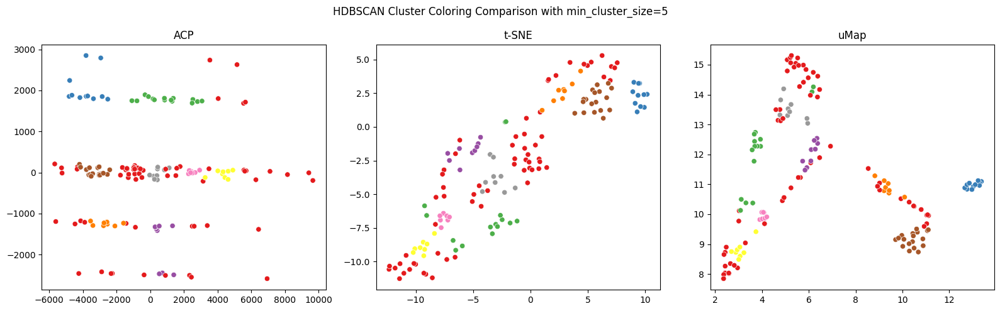

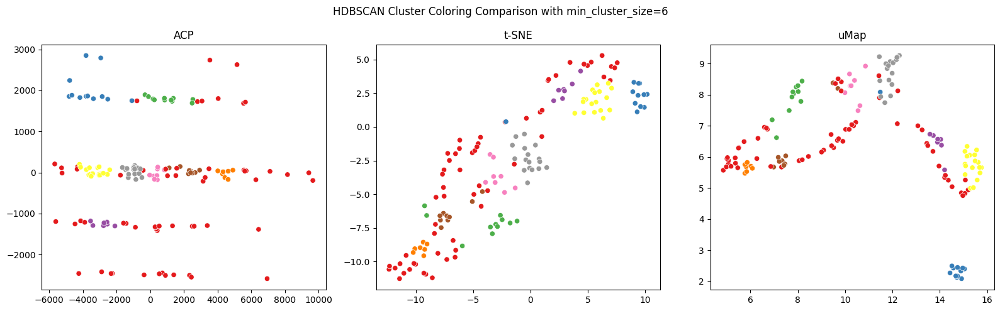

...

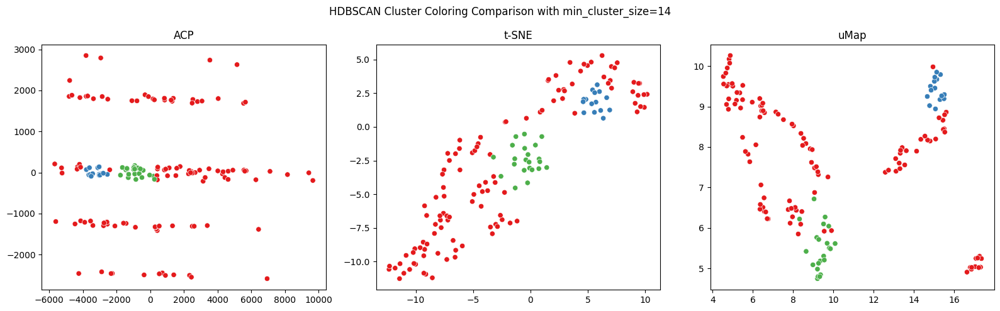

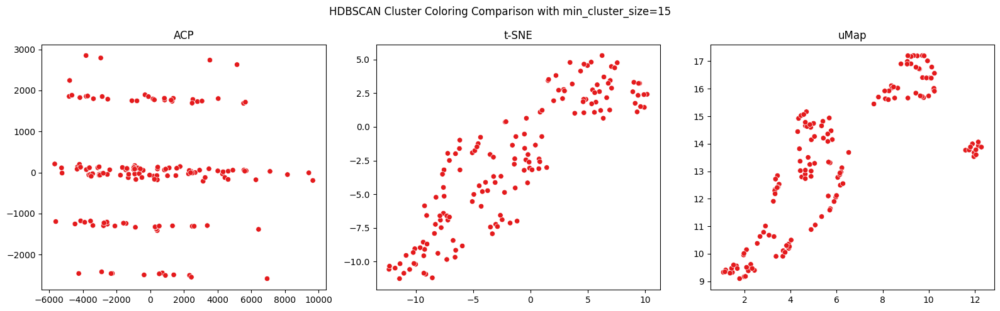

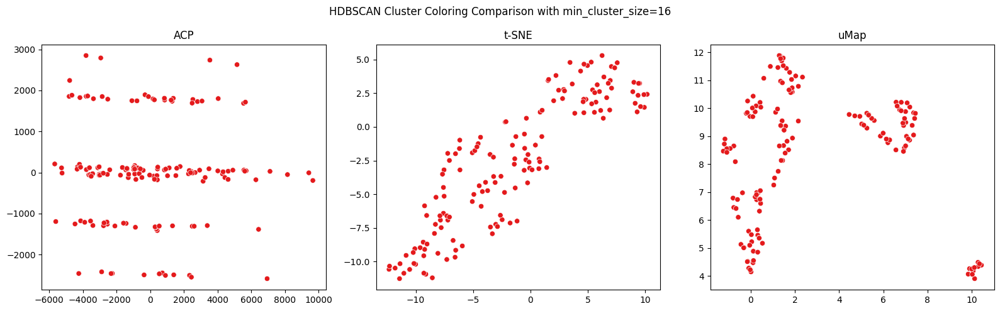

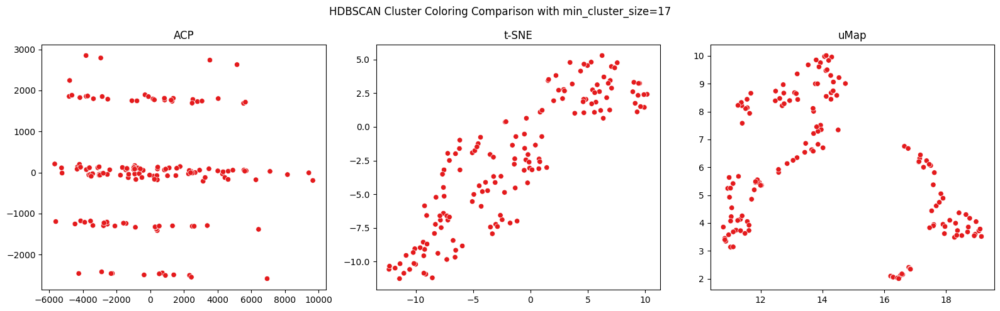

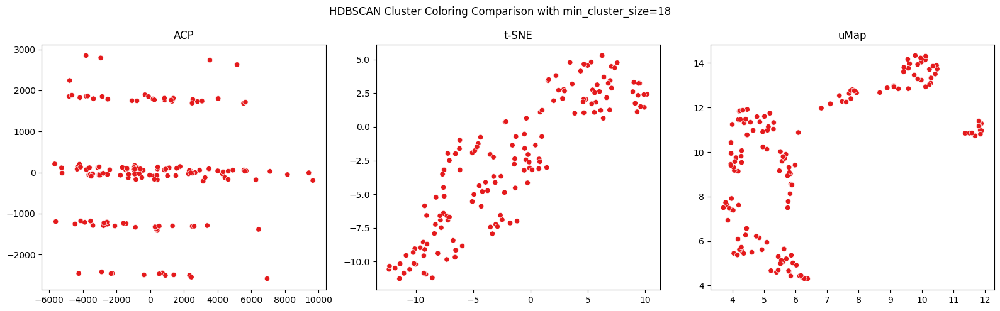

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
import hdbscan

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

min_cluster_size_list = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]

for min_cluster_size in min_cluster_size_list:


  # ACP
  pca = PCA(n_components=2)
  pca_result = pca.fit_transform(encoded_data)

  # Clustering avec HDBSCAN
  clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size)  # Vous pouvez ajuster les paramètres selon vos besoins
  cluster_labels = clusterer.fit_predict(pca_result)

  # t-SNE
  tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
  tsne_result = tsne.fit_transform(encoded_data)

  # uMap
  umap = UMAP(n_components=2)
  umap_result = umap.fit_transform(encoded_data)

  # Plotting with cluster coloring
  plt.figure(figsize=(16, 5))
  plt.suptitle('HDBSCAN Cluster Coloring Comparison with min_cluster_size=' + str(min_cluster_size))

  plt.subplot(1, 3, 1)
  sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
  plt.title('ACP')

  plt.subplot(1, 3, 2)
  sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
  plt.title('t-SNE')

  plt.subplot(1, 3, 3)
  sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
  plt.title('uMap')

  plt.tight_layout()
  plt.show()

# EIGHTH VERSION (3) - HDBSCAN for loop

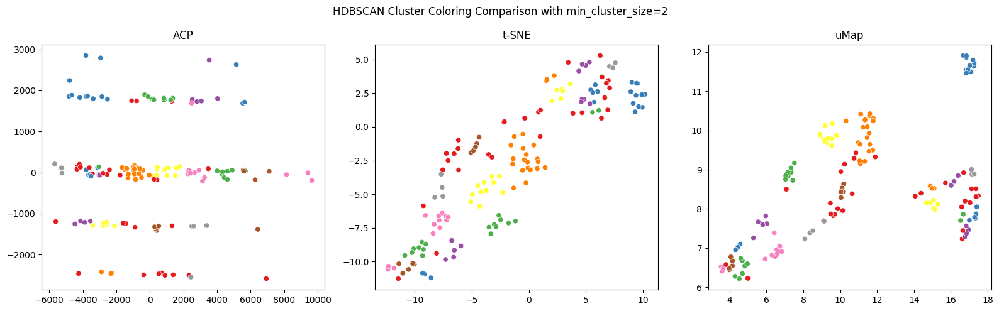

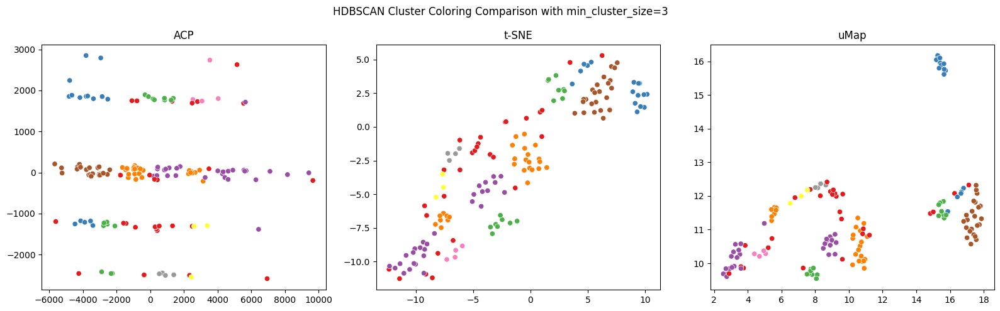

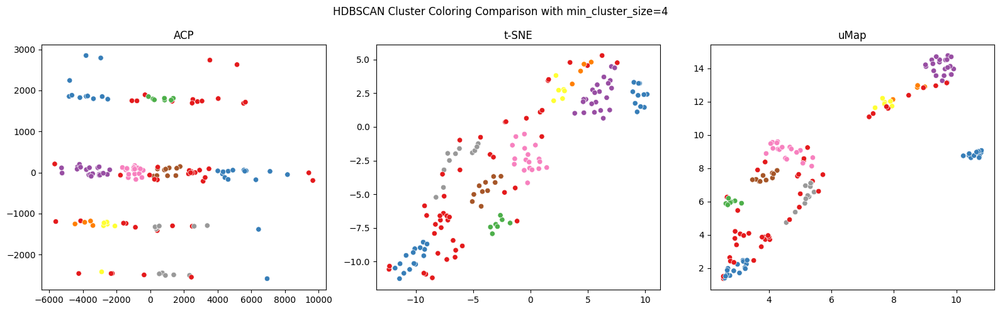

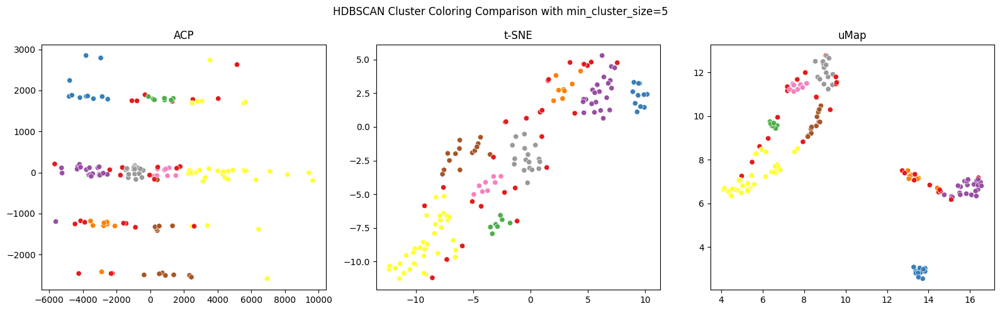

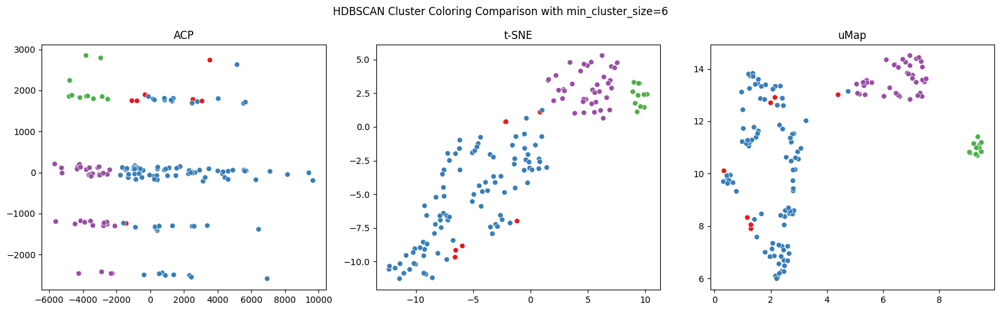

...

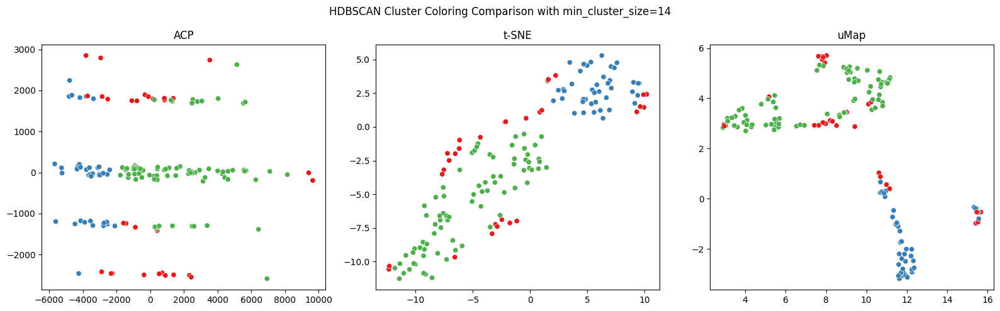

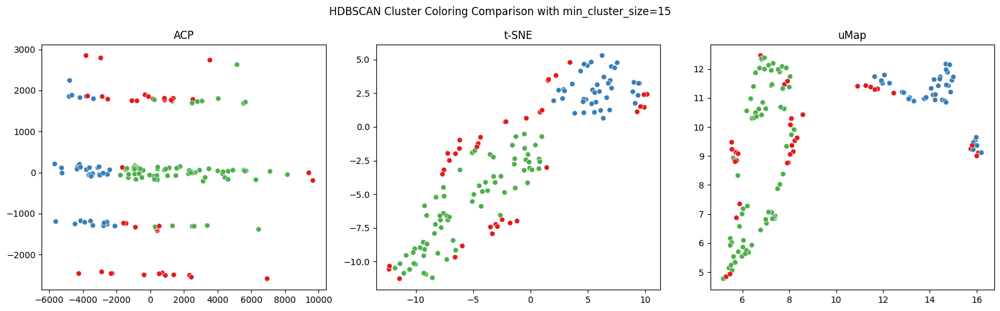

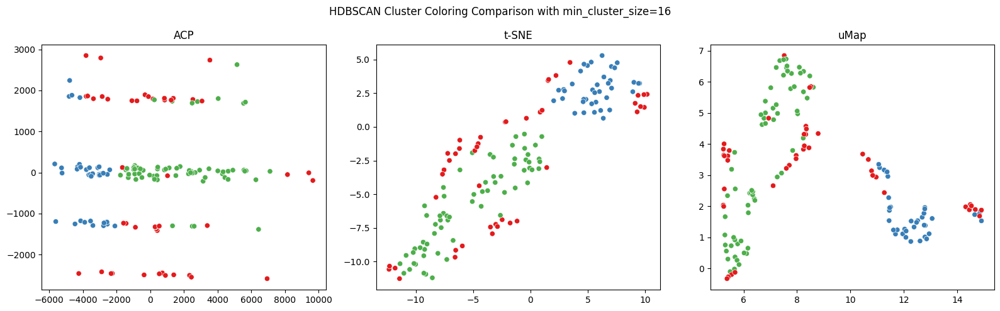

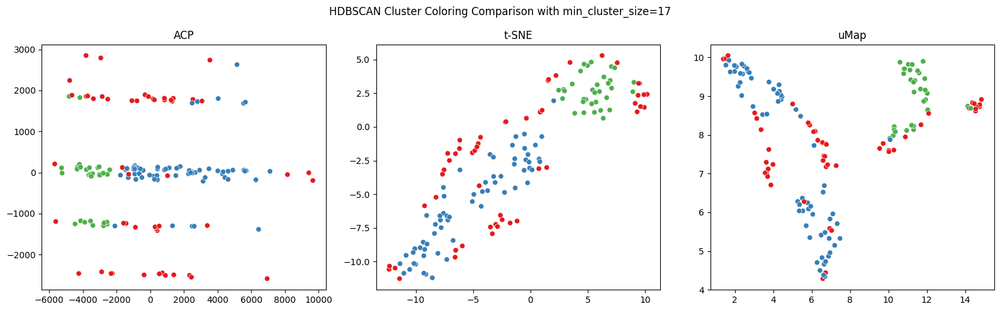

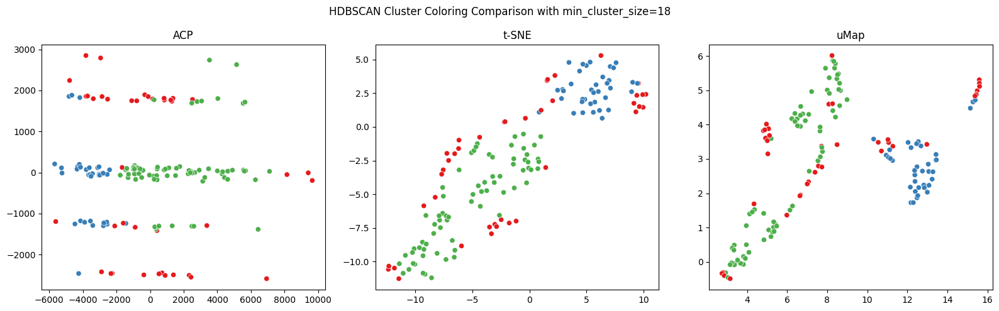

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
import hdbscan

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

min_cluster_size_list = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]

for min_cluster_size in min_cluster_size_list:


  # ACP
  pca = PCA(n_components=2)
  pca_result = pca.fit_transform(encoded_data)


  # t-SNE
  tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
  tsne_result = tsne.fit_transform(encoded_data)

  # Clustering avec HDBSCAN
  clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size)  # Vous pouvez ajuster les paramètres selon vos besoins
  cluster_labels = clusterer.fit_predict(tsne_result)

  # uMap
  umap = UMAP(n_components=2)
  umap_result = umap.fit_transform(encoded_data)

  # Plotting with cluster coloring
  plt.figure(figsize=(16, 5))
  plt.suptitle('HDBSCAN Cluster Coloring Comparison with min_cluster_size=' + str(min_cluster_size))

  plt.subplot(1, 3, 1)
  sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
  plt.title('ACP')

  plt.subplot(1, 3, 2)
  sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
  plt.title('t-SNE')

  plt.subplot(1, 3, 3)
  sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
  plt.title('uMap')

  plt.tight_layout()
  plt.show()

# SEVENTH VERSION - HDBSCAN

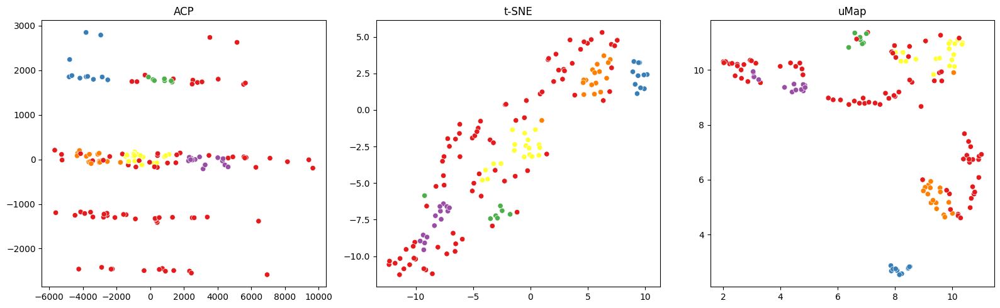

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
import hdbscan

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

# Clustering avec HDBSCAN
clusterer = hdbscan.HDBSCAN(min_cluster_size=6)  # Vous pouvez ajuster les paramètres selon vos besoins
cluster_labels = clusterer.fit_predict(encoded_data)

# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()


# SEVENTH VERSION (2) - HDBSCAN

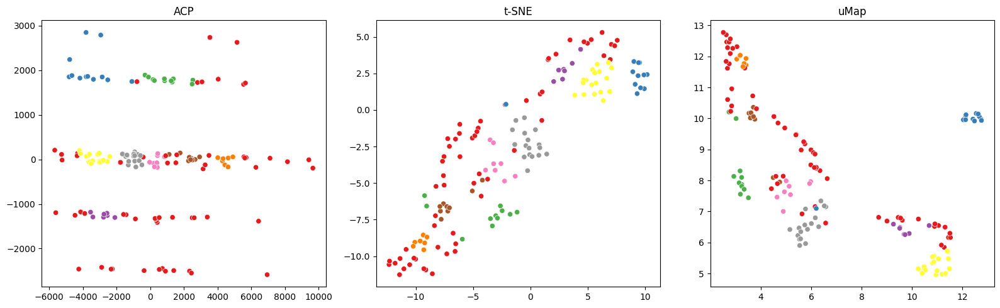

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
import hdbscan

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])


# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# Clustering avec HDBSCAN
clusterer = hdbscan.HDBSCAN(min_cluster_size=6)  # Vous pouvez ajuster les paramètres selon vos besoins
cluster_labels = clusterer.fit_predict(pca_result)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()


# SIXTH VERSION - DBSCAN WITH FOR LOOP

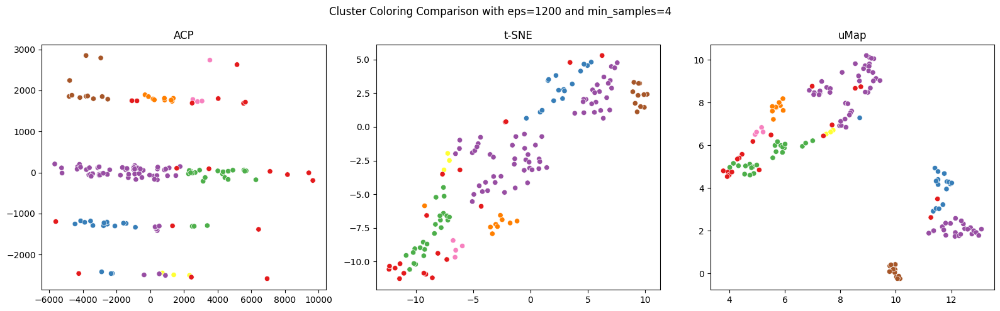

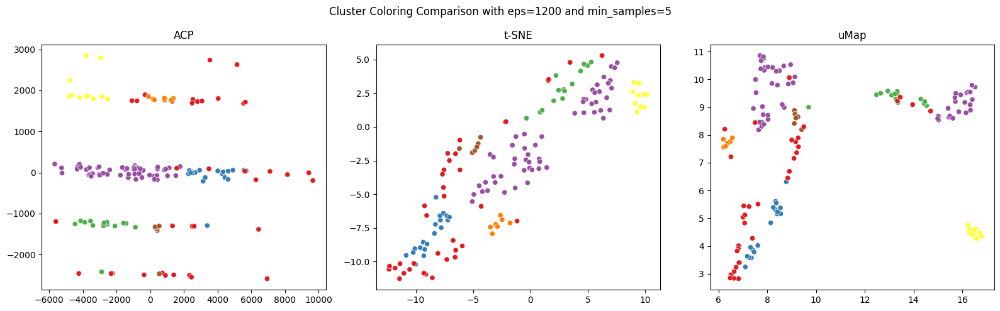

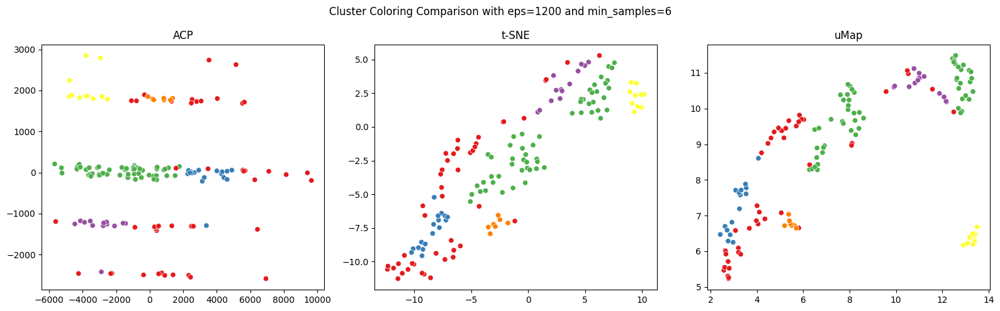

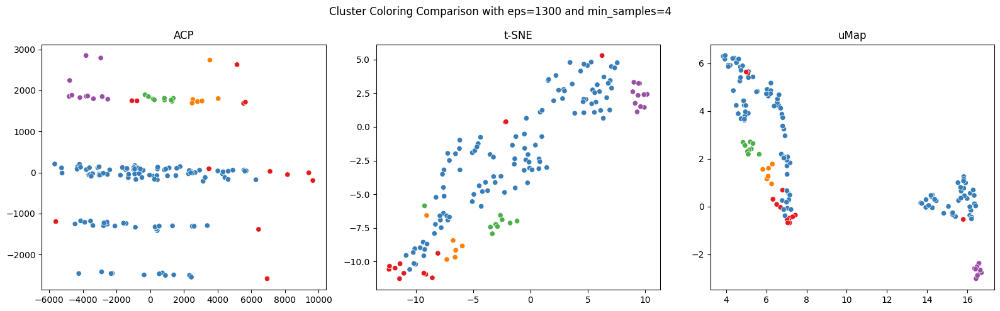

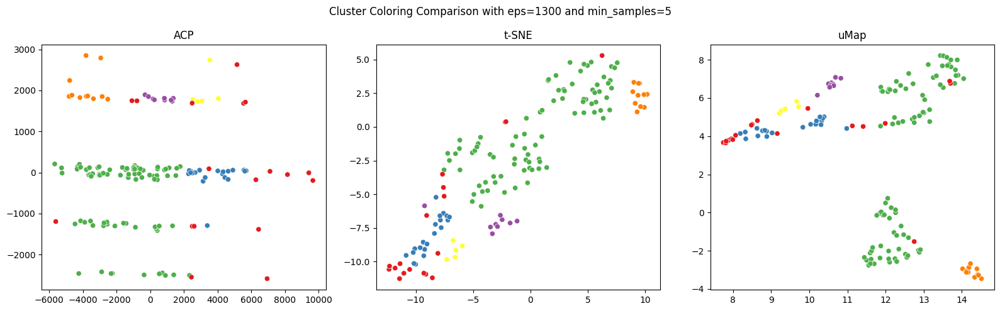

...

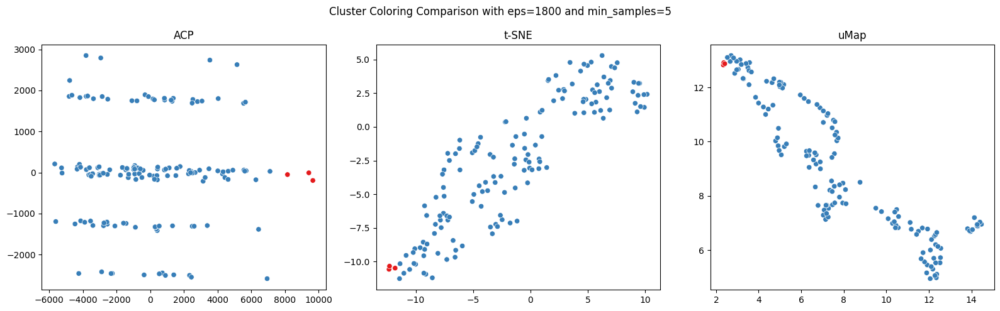

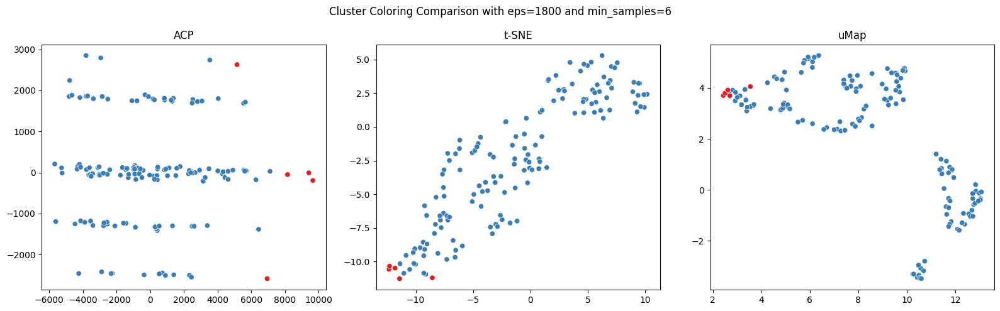

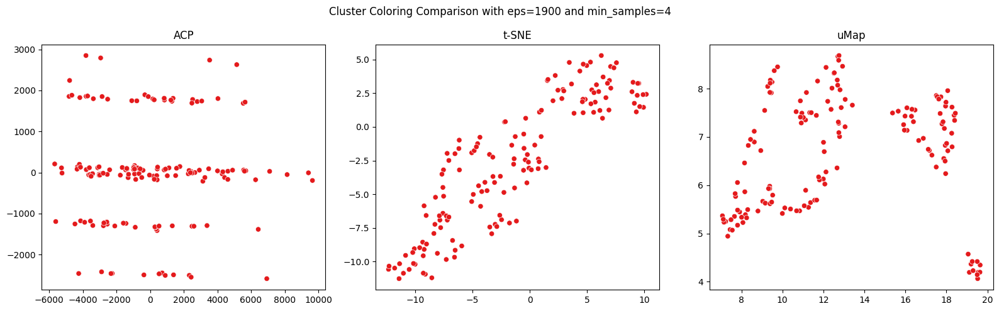

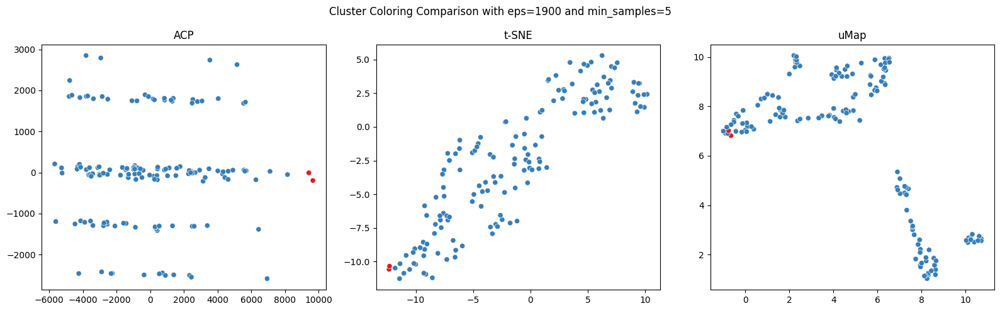

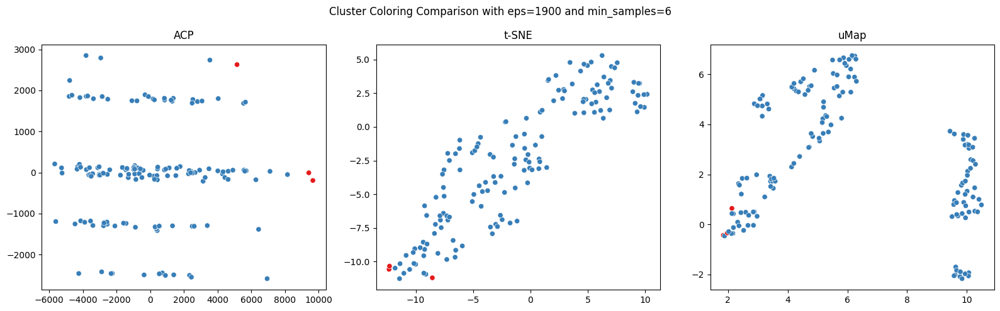

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import DBSCAN

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

eps_list = [1000, 1100, 1200, 1300, 1400, 1500, 1600]
min_samples_list = [4, 5, 6]
for eps in eps_list:
  for min_samples in min_samples_list:
    # Clustering avec DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)  # Vous pouvez ajuster les paramètres selon vos besoins
    cluster_labels = dbscan.fit_predict(encoded_data)

    # ACP
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(encoded_data)

    # t-SNE
    tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
    tsne_result = tsne.fit_transform(encoded_data)

    # uMap
    umap = UMAP(n_components=2)
    umap_result = umap.fit_transform(encoded_data)

    # Plotting with cluster coloring
    plt.figure(figsize=(16, 5))
    plt.suptitle('DBSCAN Cluster Coloring Comparison with eps=' + str(eps) + ' and min_samples=' + str(min_samples))

    plt.subplot(1, 3, 1)
    sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
    plt.title('ACP')

    plt.subplot(1, 3, 2)
    sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
    plt.title('t-SNE')

    plt.subplot(1, 3, 3)
    sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
    plt.title('uMap')

    plt.tight_layout()
    plt.show()


# SIXTH VERSION (2) - DBSCAN WITH FOR LOOP

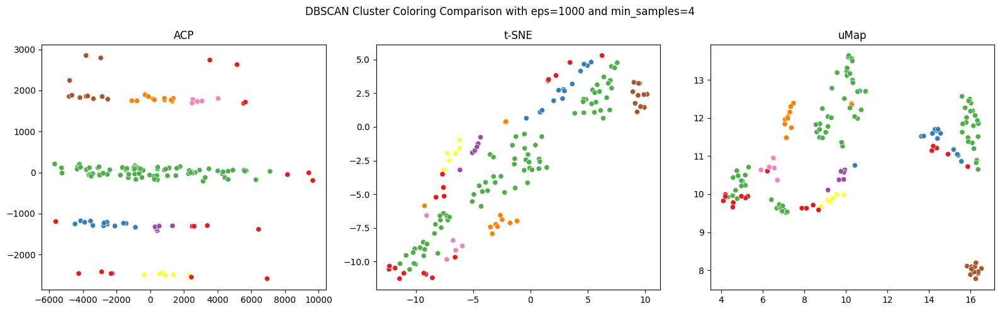

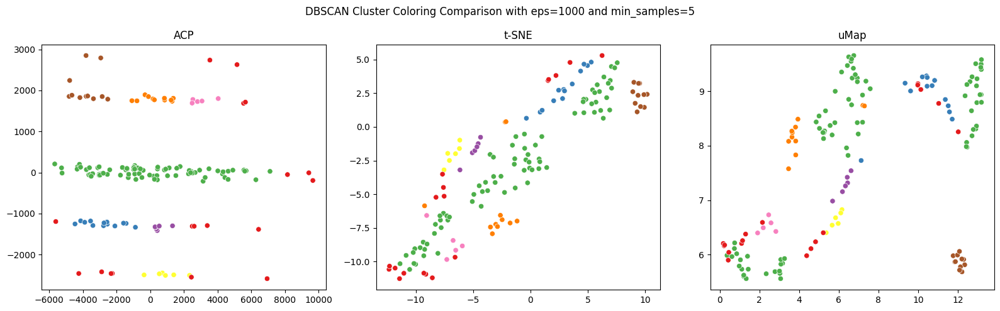

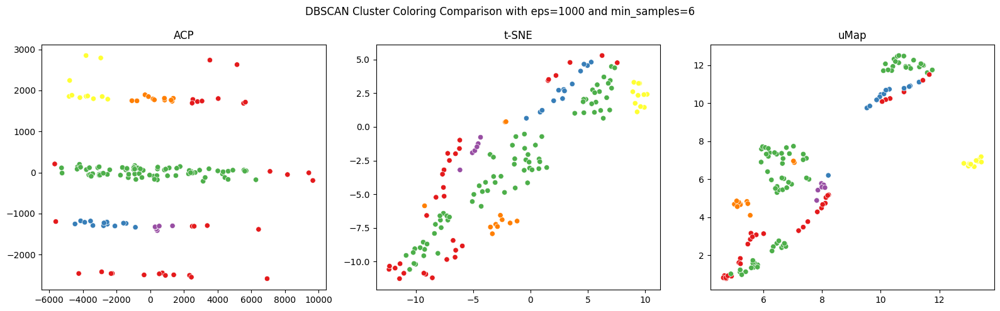

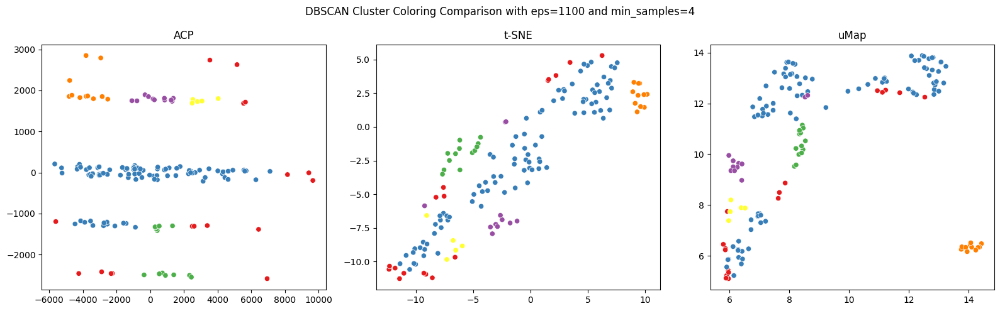

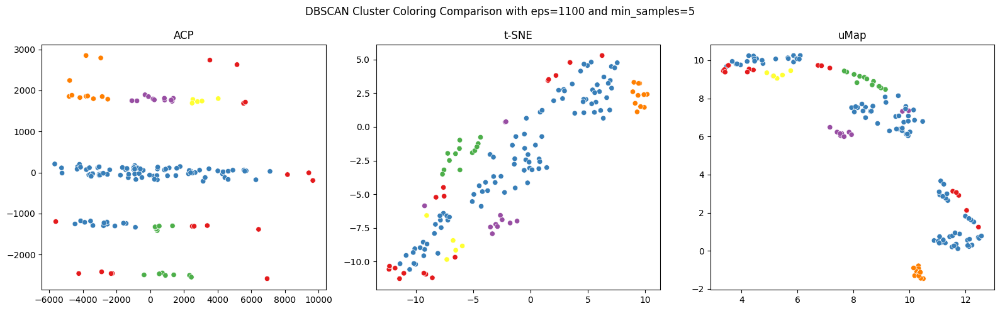

...

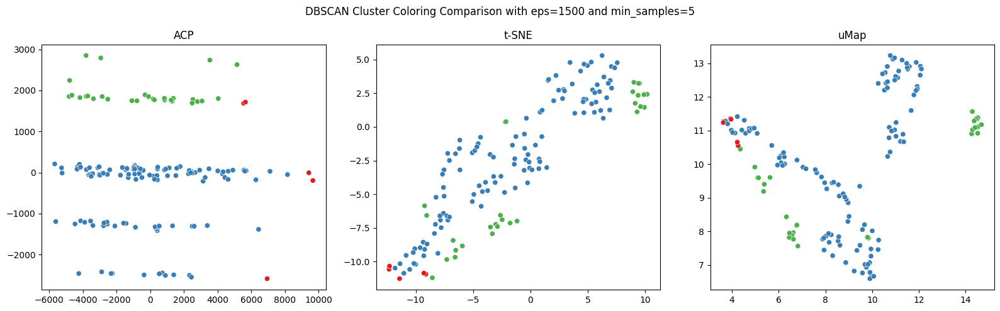

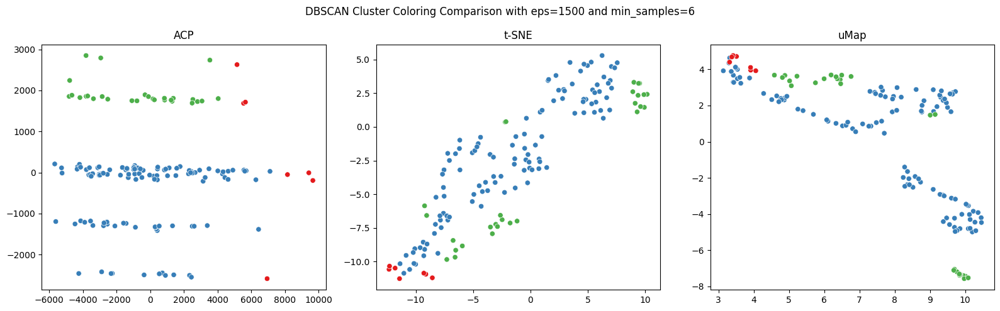

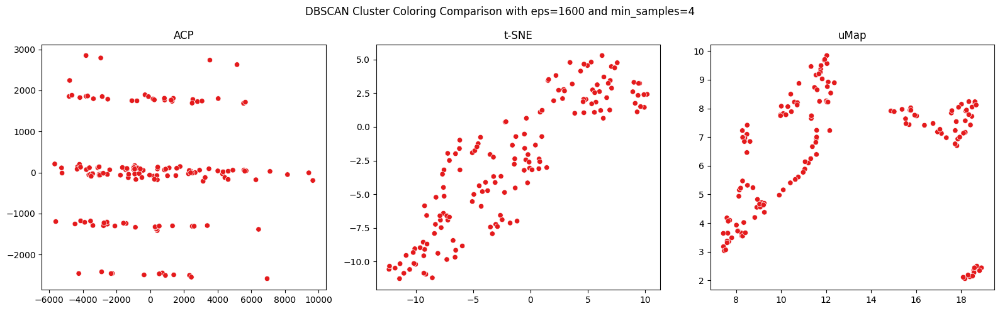

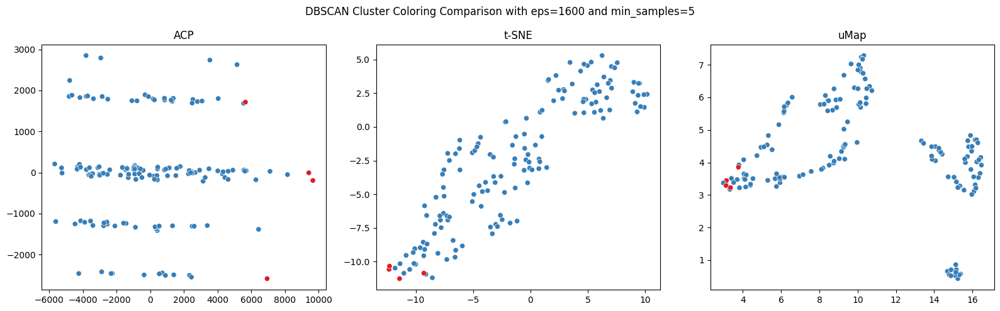

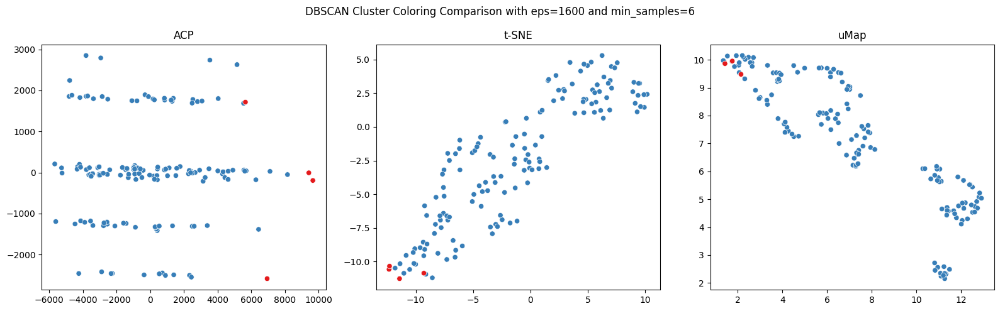

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import DBSCAN

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

eps_list = [1000, 1100, 1200, 1300, 1400, 1500, 1600]
min_samples_list = [4, 5, 6]
for eps in eps_list:
  for min_samples in min_samples_list:

    # ACP
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(encoded_data)

    # Clustering avec DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)  # Vous pouvez ajuster les paramètres selon vos besoins
    cluster_labels = dbscan.fit_predict(pca_result)

    # t-SNE
    tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
    tsne_result = tsne.fit_transform(encoded_data)

    # uMap
    umap = UMAP(n_components=2)
    umap_result = umap.fit_transform(encoded_data)

    # Plotting with cluster coloring
    plt.figure(figsize=(16, 5))
    plt.suptitle('DBSCAN Cluster Coloring Comparison with eps=' + str(eps) + ' and min_samples=' + str(min_samples))

    plt.subplot(1, 3, 1)
    sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
    plt.title('ACP')

    plt.subplot(1, 3, 2)
    sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
    plt.title('t-SNE')

    plt.subplot(1, 3, 3)
    sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
    plt.title('uMap')

    plt.tight_layout()
    plt.show()


# SIXTH VERSION (3) - DBSCAN WITH FOR LOOP

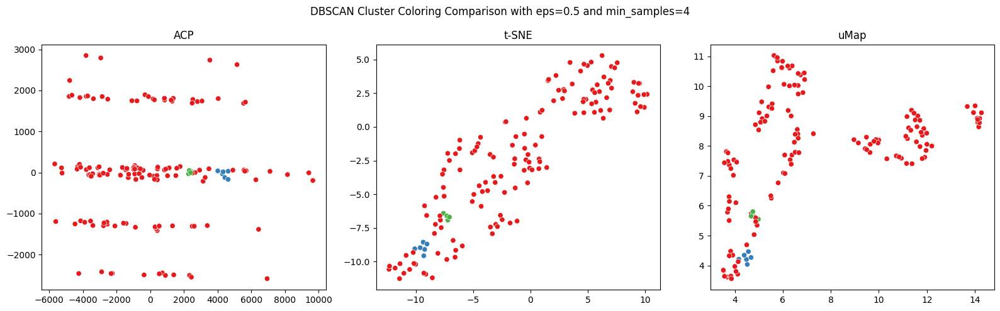

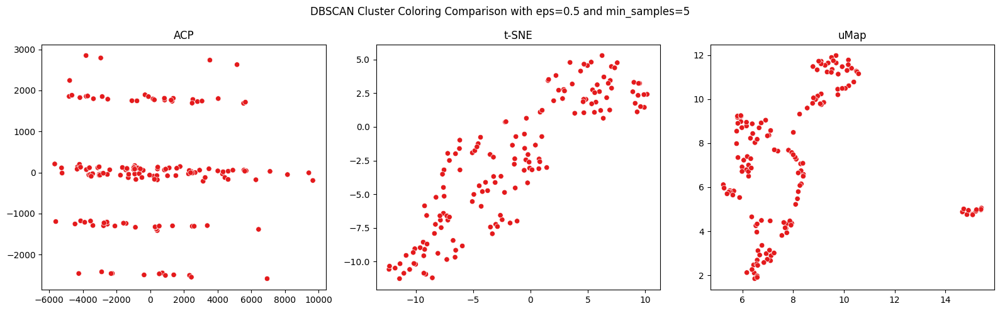

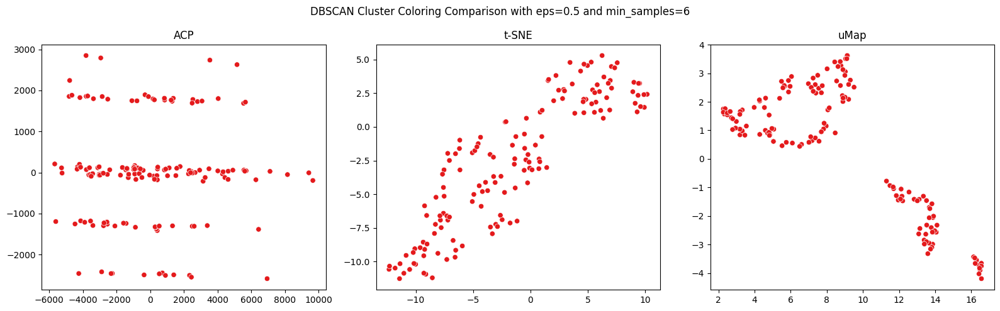

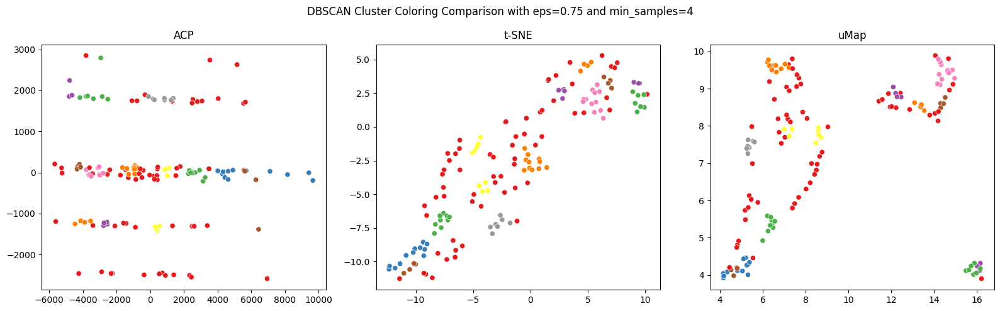

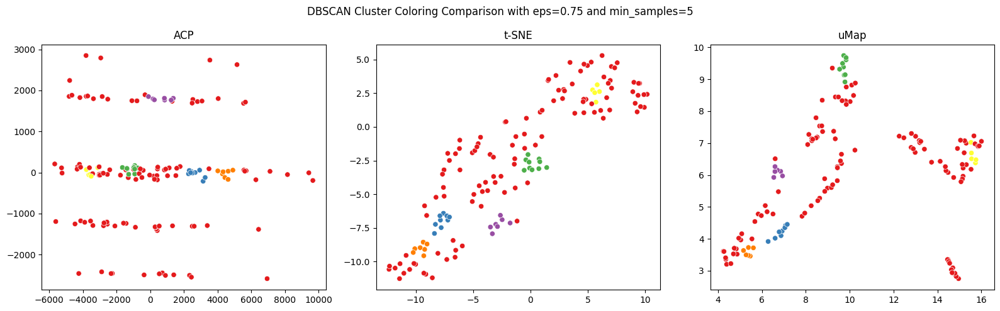

...

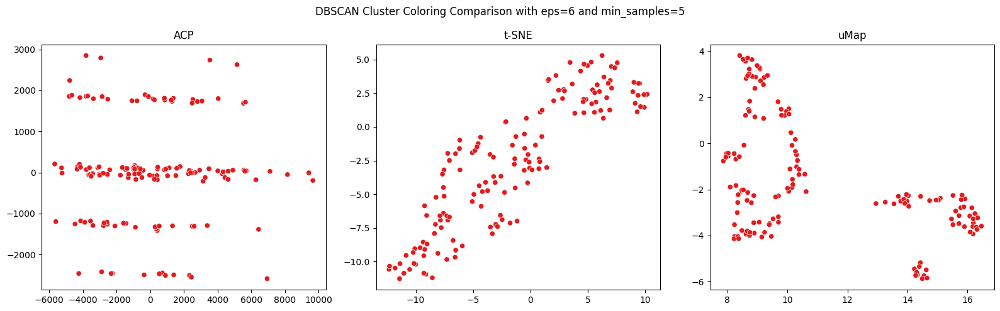

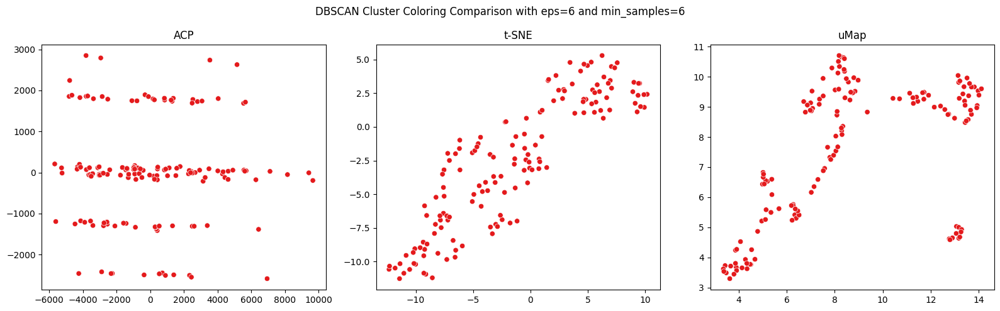

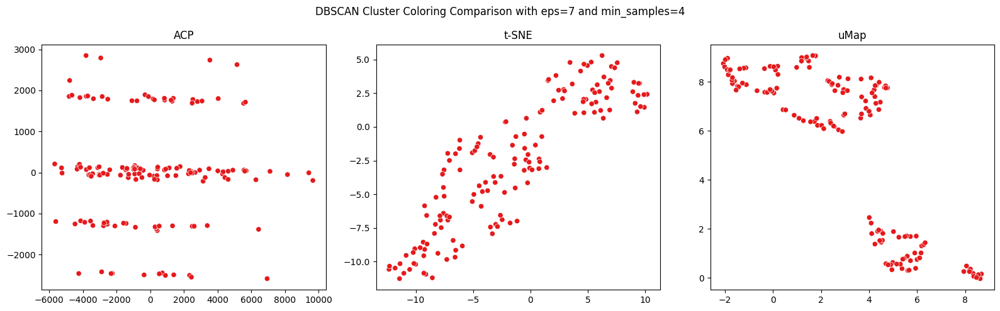

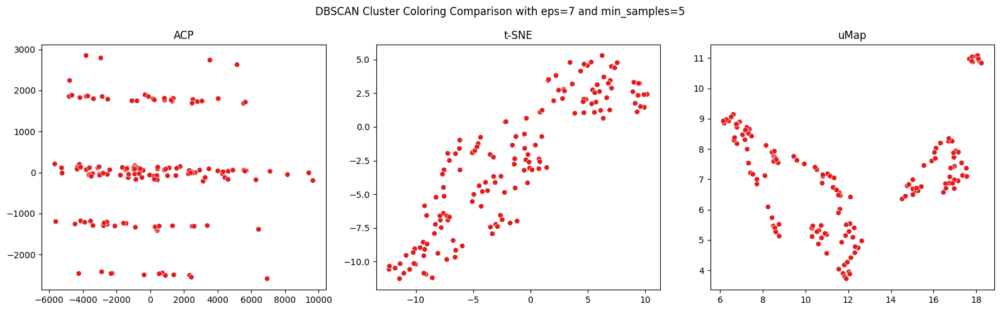

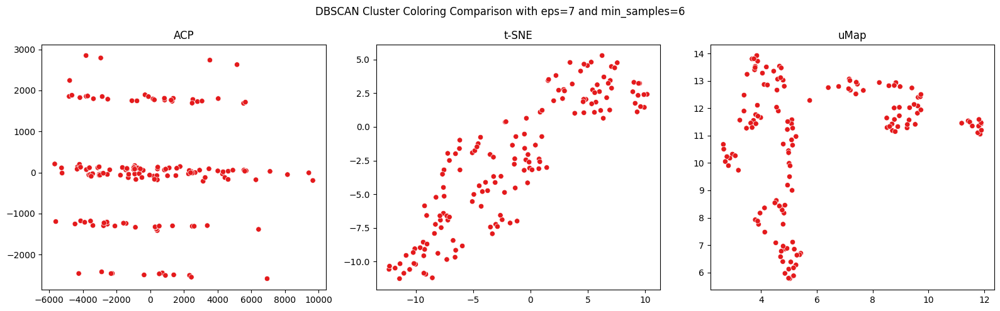

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import DBSCAN

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

eps_list = [0.5, 0.75, 1, 2, 3, 4, 5, 6, 7]
min_samples_list = [4, 5, 6]
for eps in eps_list:
  for min_samples in min_samples_list:

    # ACP
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(encoded_data)

    # t-SNE
    tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
    tsne_result = tsne.fit_transform(encoded_data)

    # Clustering avec DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)  # Vous pouvez ajuster les paramètres selon vos besoins
    cluster_labels = dbscan.fit_predict(tsne_result)

    # uMap
    umap = UMAP(n_components=2)
    umap_result = umap.fit_transform(encoded_data)

    # Plotting with cluster coloring
    plt.figure(figsize=(16, 5))
    plt.suptitle('DBSCAN Cluster Coloring Comparison with eps=' + str(eps) + ' and min_samples=' + str(min_samples))

    plt.subplot(1, 3, 1)
    sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
    plt.title('ACP')

    plt.subplot(1, 3, 2)
    sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
    plt.title('t-SNE')

    plt.subplot(1, 3, 3)
    sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
    plt.title('uMap')

    plt.tight_layout()
    plt.show()


# FIFTH VERSION - DBSCAN

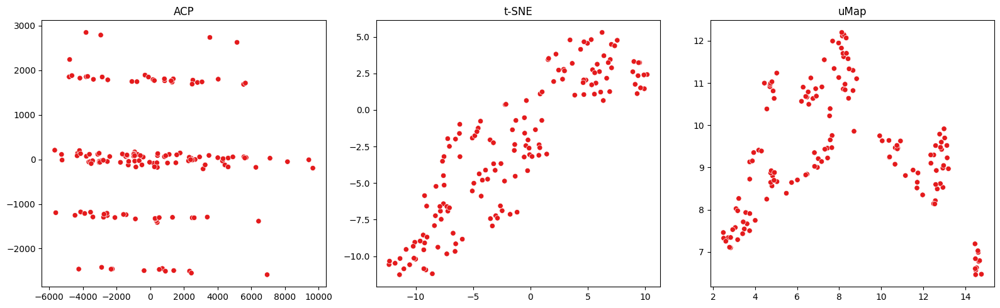

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import DBSCAN

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

# Clustering avec DBSCAN
dbscan = DBSCAN(eps=1, min_samples=2)  # Vous pouvez ajuster les paramètres selon vos besoins
cluster_labels = dbscan.fit_predict(encoded_data)

# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()


# FIFTH VERSION (2) - DBSCAN

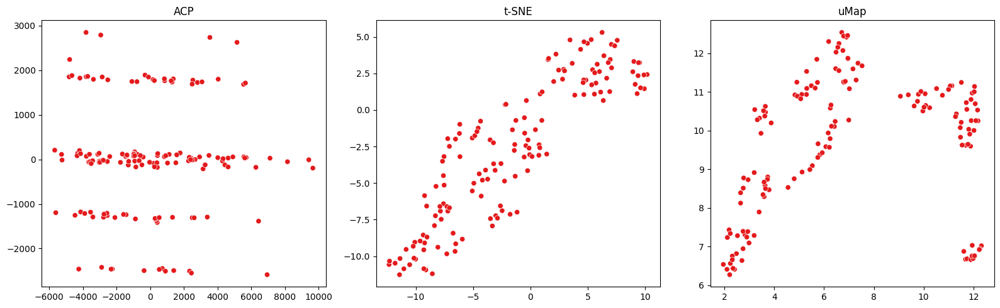

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import DBSCAN

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])


# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# Clustering avec DBSCAN
dbscan = DBSCAN(eps=1, min_samples=2)  # Vous pouvez ajuster les paramètres selon vos besoins
cluster_labels = dbscan.fit_predict(pca_result)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()


# FOURTH VERSION - clustering hiérarchique

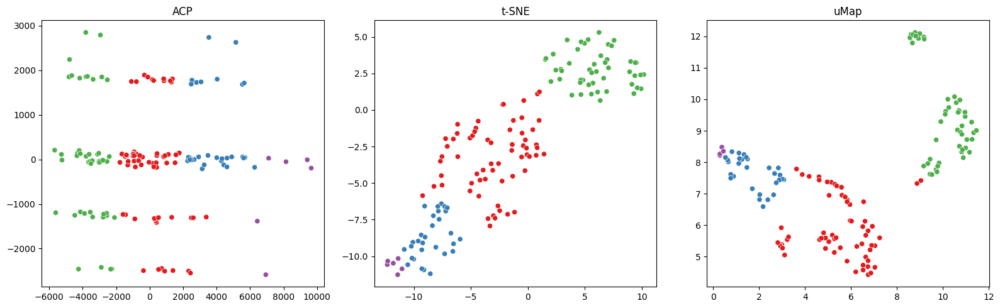

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import AgglomerativeClustering

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

# Clustering
agg_clustering = AgglomerativeClustering(n_clusters=4)  # Choisissez le nombre de clusters
cluster_labels = agg_clustering.fit_predict(encoded_data)

# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()

# FOURTH VERSION (2) - clustering hiérarchique

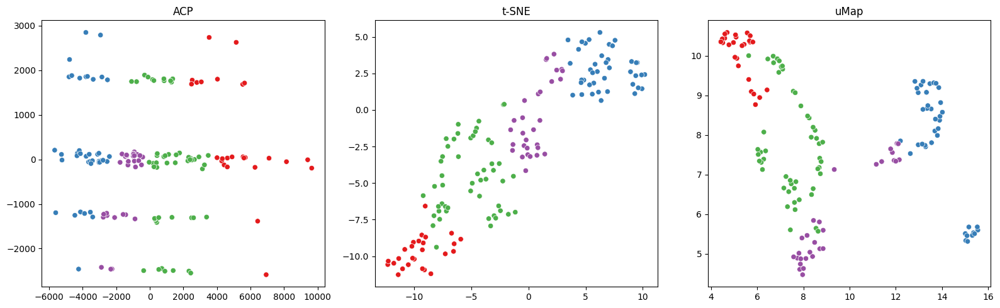

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import AgglomerativeClustering

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# Clustering
agg_clustering = AgglomerativeClustering(n_clusters=4)  # Choisissez le nombre de clusters
cluster_labels = agg_clustering.fit_predict(pca_result)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()

# THIRD VERSION - k-medoids

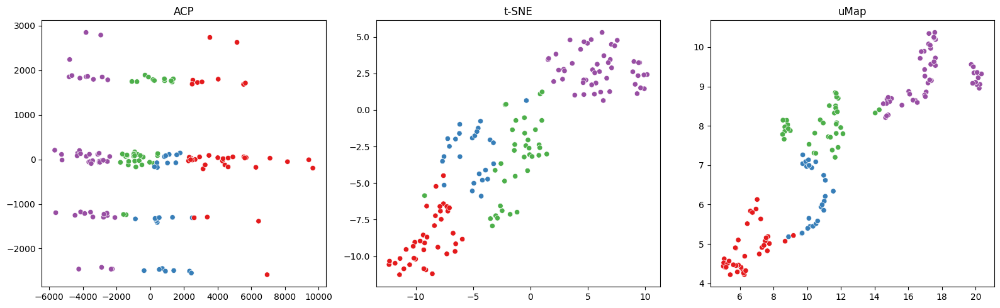

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn_extra.cluster import KMedoids

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

# Clustering
kmedoids = KMedoids(n_clusters=4, random_state=0)  # Choisissez le nombre de clusters
cluster_labels = kmedoids.fit_predict(encoded_data)

# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()


# THIRD VERSION (2) - k-medoids

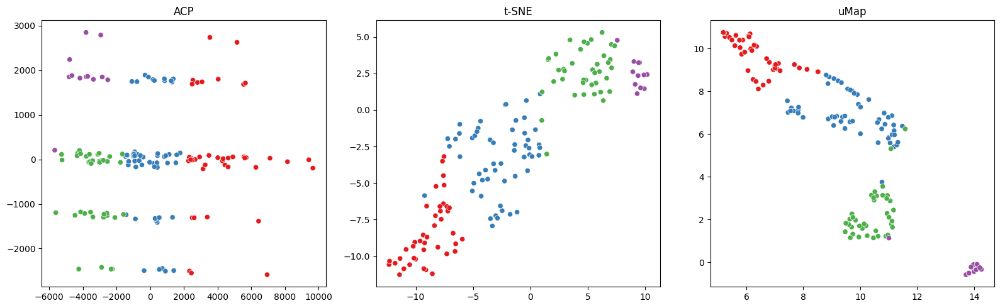

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn_extra.cluster import KMedoids

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])


# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# Clustering
kmedoids = KMedoids(n_clusters=4, random_state=0)  # Choisissez le nombre de clusters
cluster_labels = kmedoids.fit_predict(pca_result)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()


# SECOND VERSION - Affinity propagation

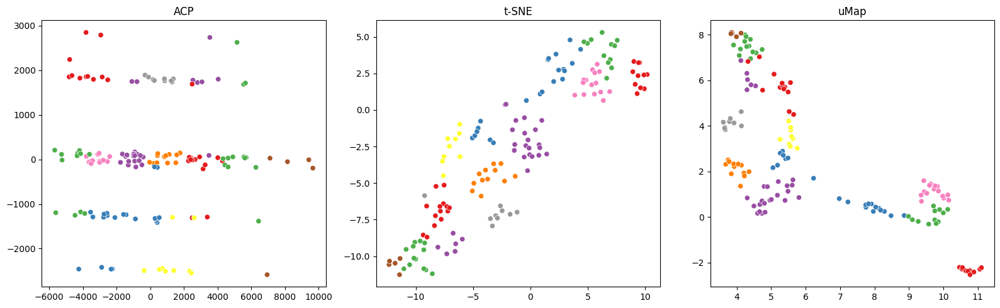

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import AffinityPropagation

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

# Clustering
affprop = AffinityPropagation()
cluster_labels = affprop.fit_predict(encoded_data)

# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()


# SECOND VERSION (2) - Affinity propagation

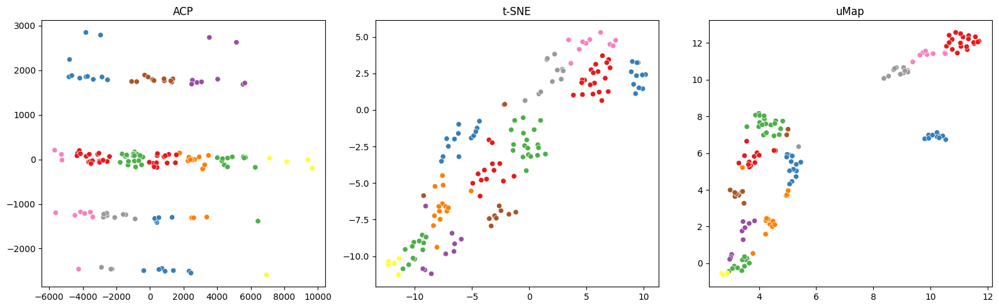

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import AffinityPropagation

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# Clustering
affprop = AffinityPropagation()
cluster_labels = affprop.fit_predict(pca_result)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()

# FIRST VERSION - k-means

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


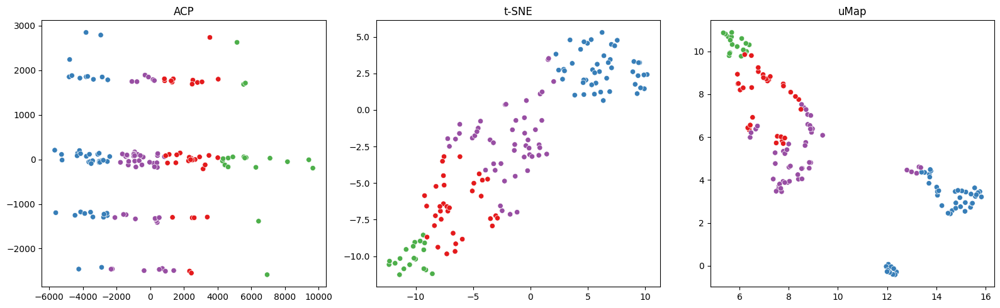

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

# Clustering
kmeans = KMeans(n_clusters=4)  # Choisissez le nombre de clusters
cluster_labels = kmeans.fit_predict(encoded_data)

# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()


# FIRST VERSION (2) - k-means


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


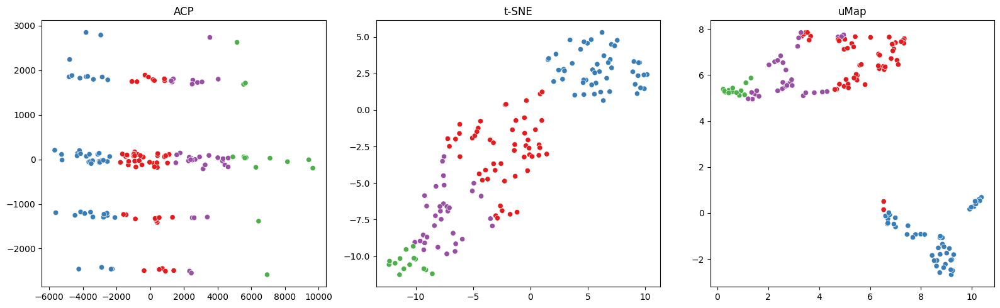

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)


# Clustering
kmeans = KMeans(n_clusters=4)  # Choisissez le nombre de clusters
cluster_labels = kmeans.fit_predict(pca_result)


# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()


# ZEROTH VERSION - SPECTRAL CLUSTERING

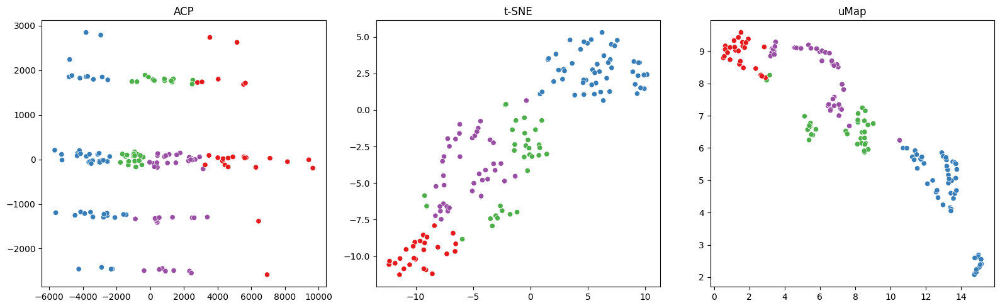

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import SpectralClustering

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# Spectral Clustering
spectral_clusterer = SpectralClustering(n_clusters=4, affinity='nearest_neighbors', random_state=42)
cluster_labels = spectral_clusterer.fit_predict(pca_result)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()

# MINUS ONETH VERSION - GaussianMixture

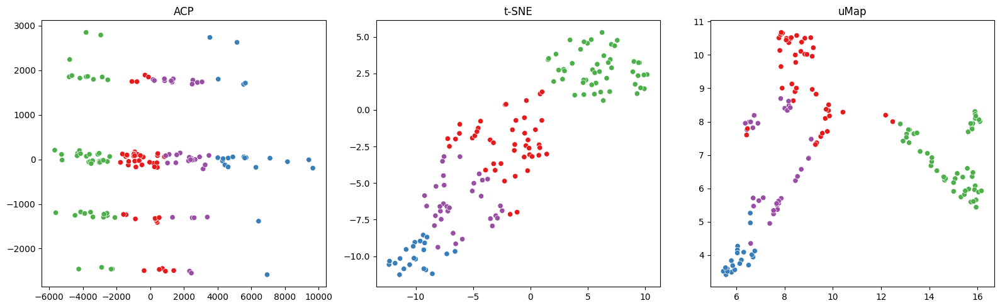

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
from sklearn.mixture import GaussianMixture

# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])


# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# Gaussian Mixture
gmm = GaussianMixture(n_components=4, random_state=42)
cluster_labels = gmm.fit_predict(pca_result)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting with cluster coloring
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], hue=cluster_labels, palette='Set1', legend=False)
plt.title('uMap')

plt.tight_layout()
plt.show()


# First draft

In [ ]:
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import LabelEncoder

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv('habitat_composition_by_station.csv')

In [ ]:
df

,LID,Site,Code,Commune,LD,Transect,Dynamique,Position,Annee,SMMini,...,water_cover_250,total_edge_length_500,edge_density_500,Shannon_landscape_diversity_500,grass_and_shub_cover_500,deciduous_forest_cover_500,coniferous_forest_cover_500,mineral_cover_500,ice_and_snow_cover_500,water_cover_500
0,1,A,A1,Mijanes,Estagnet,375,rouge,estive,2022,5765,...,0.0000,4740,60.4207,0.1972,95.9592,0.0000,1.9630,2.0778,0.0,0.0000
1,2,A,A2,Mijanes,Estagnet,375,rouge,lisiere,2022,7108,...,3.5186,11970,152.5813,0.5587,84.0408,0.0000,11.3576,3.6201,0.0,0.9815
2,3,A,A3,Mijanes,Estagnet,374,bleu,estive,2022,7142,...,0.0000,10190,129.8917,0.5047,84.3212,0.0000,13.6520,0.3952,0.0,1.6316
3,4,A,A4,Mijanes,Estagnet,374,bleu,lisiere,2022,7175,...,0.0000,10630,135.5003,0.5124,83.3525,0.0000,15.0797,0.5609,0.0,1.0070
4,5,B,B1,Mijanes,Trabesses,373,rouge,estive,2022,5810,...,0.0000,5570,71.0006,0.5508,83.6201,5.5449,10.8349,0.0000,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143,144,AJ,AJ4,Formiguères,Serra dels Alarbs,44,bleu,lisiere,2023,6992,...,0.0000,8680,110.6437,0.6339,82.3582,6.9726,8.7954,1.8738,0.0,0.0000
144,145,AK,AK1,Saint-Lary,Col de l'Herbe Soulette,386,rouge,estive,2023,6936,...,0.0000,4440,56.5966,0.7249,64.0408,1.8101,34.1491,0.0000,0.0,0.0000
145,146,AK,AK2,Saint-Lary,Col de l'Herbe Soulette,386,rouge,lisiere,2023,4559,...,0.0000,5450,69.4710,0.8039,44.6144,2.9955,52.3901,0.0000,0.0,0.0000
146,147,AK,AK3,Saint-Lary,Col de l'Herbe Soulette,228,bleu,estive,2023,7175,...,0.0000,2150,27.4060,0.6730,60.9305,0.0510,39.0185,0.0000,0.0,0.0000


In [ ]:
# In order to filter : df_layer_1 = df[df["Transect"]==1]

In [ ]:
# Sélection des colonnes pertinentes pour l'analyse de la composition d'habitats
features = df.iloc[:, 3:]

features

,Commune,LD,Transect,Dynamique,Position,Annee,SMMini,LAT,LON,total_edge_length_100,...,water_cover_250,total_edge_length_500,edge_density_500,Shannon_landscape_diversity_500,grass_and_shub_cover_500,deciduous_forest_cover_500,coniferous_forest_cover_500,mineral_cover_500,ice_and_snow_cover_500,water_cover_500
0,Mijanes,Estagnet,375,rouge,estive,2022,5765,42.6886,1.9722,0,...,0.0000,4740,60.4207,0.1972,95.9592,0.0000,1.9630,2.0778,0.0,0.0000
1,Mijanes,Estagnet,375,rouge,lisiere,2022,7108,42.6899,1.9765,150,...,3.5186,11970,152.5813,0.5587,84.0408,0.0000,11.3576,3.6201,0.0,0.9815
2,Mijanes,Estagnet,374,bleu,estive,2022,7142,42.6957,1.9750,350,...,0.0000,10190,129.8917,0.5047,84.3212,0.0000,13.6520,0.3952,0.0,1.6316
3,Mijanes,Estagnet,374,bleu,lisiere,2022,7175,42.6936,1.9756,250,...,0.0000,10630,135.5003,0.5124,83.3525,0.0000,15.0797,0.5609,0.0,1.0070
4,Mijanes,Trabesses,373,rouge,estive,2022,5810,42.7347,2.0095,0,...,0.0000,5570,71.0006,0.5508,83.6201,5.5449,10.8349,0.0000,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143,Formiguères,Serra dels Alarbs,44,bleu,lisiere,2023,6992,42.6040,2.0047,690,...,0.0000,8680,110.6437,0.6339,82.3582,6.9726,8.7954,1.8738,0.0,0.0000
144,Saint-Lary,Col de l'Herbe Soulette,386,rouge,estive,2023,6936,42.8861,0.8684,0,...,0.0000,4440,56.5966,0.7249,64.0408,1.8101,34.1491,0.0000,0.0,0.0000
145,Saint-Lary,Col de l'Herbe Soulette,386,rouge,lisiere,2023,4559,42.8874,0.8699,460,...,0.0000,5450,69.4710,0.8039,44.6144,2.9955,52.3901,0.0000,0.0,0.0000
146,Saint-Lary,Col de l'Herbe Soulette,228,bleu,estive,2023,7175,42.8860,0.8650,0,...,0.0000,2150,27.4060,0.6730,60.9305,0.0510,39.0185,0.0000,0.0,0.0000


In [ ]:
# Sélection des colonnes pertinentes pour l'encodage des étiquettes
categorical_columns = ['LD', 'Position', 'Dynamique', 'Commune']  # Colonnes catégorielles à encoder

# Copie des données pour ne pas modifier les données originales
encoded_data = features.copy()

# Effectuer l'encodage des étiquettes pour chaque colonne catégorielle
label_encoder = LabelEncoder()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(features[column])

encoded_data

,Commune,LD,Transect,Dynamique,Position,Annee,SMMini,LAT,LON,total_edge_length_100,...,water_cover_250,total_edge_length_500,edge_density_500,Shannon_landscape_diversity_500,grass_and_shub_cover_500,deciduous_forest_cover_500,coniferous_forest_cover_500,mineral_cover_500,ice_and_snow_cover_500,water_cover_500
0,18,11,375,1,0,2022,5765,42.6886,1.9722,0,...,0.0000,4740,60.4207,0.1972,95.9592,0.0000,1.9630,2.0778,0.0,0.0000
1,18,11,375,1,1,2022,7108,42.6899,1.9765,150,...,3.5186,11970,152.5813,0.5587,84.0408,0.0000,11.3576,3.6201,0.0,0.9815
2,18,11,374,0,0,2022,7142,42.6957,1.9750,350,...,0.0000,10190,129.8917,0.5047,84.3212,0.0000,13.6520,0.3952,0.0,1.6316
3,18,11,374,0,1,2022,7175,42.6936,1.9756,250,...,0.0000,10630,135.5003,0.5124,83.3525,0.0000,15.0797,0.5609,0.0,1.0070
4,18,34,373,1,0,2022,5810,42.7347,2.0095,0,...,0.0000,5570,71.0006,0.5508,83.6201,5.5449,10.8349,0.0000,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143,11,32,44,0,1,2023,6992,42.6040,2.0047,690,...,0.0000,8680,110.6437,0.6339,82.3582,6.9726,8.7954,1.8738,0.0,0.0000
144,24,7,386,1,0,2023,6936,42.8861,0.8684,0,...,0.0000,4440,56.5966,0.7249,64.0408,1.8101,34.1491,0.0000,0.0,0.0000
145,24,7,386,1,1,2023,4559,42.8874,0.8699,460,...,0.0000,5450,69.4710,0.8039,44.6144,2.9955,52.3901,0.0000,0.0,0.0000
146,24,7,228,0,0,2023,7175,42.8860,0.8650,0,...,0.0000,2150,27.4060,0.6730,60.9305,0.0510,39.0185,0.0000,0.0,0.0000


# ACP study

In [ ]:
# ACP
pca = PCA(n_components=2)
pca_result = pca.fit_transform(encoded_data)

# t-SNE study

In [ ]:
# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_result = tsne.fit_transform(encoded_data)

# uMap study

In [ ]:
# uMap
umap = UMAP(n_components=2)
umap_result = umap.fit_transform(encoded_data)

# Plotting

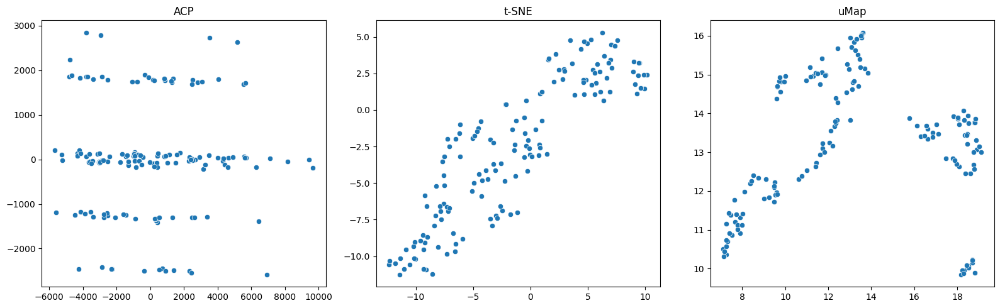

In [ ]:
# Plotting
plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1])
plt.title('ACP')

plt.subplot(1, 3, 2)
sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1])
plt.title('t-SNE')

plt.subplot(1, 3, 3)
sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1])
plt.title('uMap')

plt.tight_layout()
plt.show()